<H3>    First Name: Balkattu Shreekantha Uttam
<H3>    Last Name: Kannantha
<H3>    USC ID: 9202391620
<H3>    Github UserName: Uttamkannantha

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC, LinearSVC

from sklearn.metrics import hamming_loss
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
import numpy as np



from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

<h4>(a) Download the Anuran Calls (MFCCs) Data Set from: https://archive.ics. uci.edu/ml/datasets/Anuran+Calls+%28MFCCs%29. Choose 70% of the data randomly as the training set.

In [2]:
df = pd.read_csv('../data/Anuran Calls (MFCCs)/Frogs_MFCCs.csv')

trainDf, testDf = train_test_split(df, train_size = 0.7, shuffle=True)


In [3]:
print("Train data:",trainDf.shape)

Train data: (5036, 26)


In [4]:
print("Test data:",testDf.shape)

Test data: (2159, 26)


<h4>(b) Each instance has three labels: Families, Genus, and Species. Each of the labels has multiple classes. We wish to solve a multi-class and multi-label problem. One of the most important approaches to multi-label classification is to train a classifier for each label (binary relevance). We first try this approach:

<h4>i. Research exact match and hamming score/ loss methods for evaluating multi- label classification and use them in evaluating the classifiers in this problem.


Exact Match (Exact match ratio):  Its a ratio or percentage where the partial correct samples are ignored and keeping only the samples that are correctly classified. This might give a problem as muilt label classification are know to  have partially corrent samples as well.<br>

Hamming loss: Its a ratio of wrong labels to the total number of labels.


<h4>ii. Train a SVM for each of the labels, using Gaussian kernels and one versus all classifiers. Determine the weight of the SVM penalty and the width of the Gaussian Kernel using 10 fold cross validation.1 You are welcome to try to solve the problem with both standardized 2 and raw attributes and report the results.

In [5]:
xTrainDf = trainDf.iloc[:, :-4]
yTrainDf = trainDf.iloc[:, -4:-1]
xTestDf = testDf.iloc[:, :-4]
yTestDf = testDf.iloc[:, -4:-1]

# xTrainDf = xTrainDf.reset_index()
# yTrainDf = yTrainDf.reset_index()
# xTestDf = xTestDf.reset_index()
# yTestDf = yTestDf.reset_index()

In [6]:
print("Train data:x",xTrainDf.shape)
print("Test data:x",xTestDf.shape)

Train data:x (5036, 22)
Test data:x (2159, 22)


In [7]:
print("Train data:y",yTrainDf.shape)
print("Test data:y",yTestDf.shape)

Train data:y (5036, 3)
Test data:y (2159, 3)


In [8]:
classes = ['Family', 'Genus', 'Species']

In [9]:
#Train a SVM for each of the labels, using Gaussian kernels and one versus all classifiers.
predictedY={}
C_range = [1, 10, 100, 1000]

Gamma_range = [1e-4, 1e-3, 0.01, 0.1, 0.2, 0.5,10]

for i in classes:
    
    print("............................................")
    print("For class:", i)
    print("............................................")
    
    model = GridSearchCV(SVC(decision_function_shape='ovr', kernel='rbf'), cv = 10 , param_grid=dict(gamma=Gamma_range, C=C_range))
    
    model.fit(xTrainDf, yTrainDf[[i]])
    
    predictedY[i] = model.predict(xTestDf)

    #Calculate hamming loss
    print("Hamming loss for ",i," is ",hamming_loss(yTestDf[[i]], predictedY[i]))

    #print classification report
    print("Classification report for ",i," is ",classification_report(yTestDf[[i]], predictedY[i]))
    
    #print weight of svm penalty

    print("Weight of SVM penalty for ",i," is ",model.best_estimator_.C)

    


............................................
For class: Family
............................................
Hamming loss for  Family  is  0.009263547938860583
Classification report for  Family  is                   precision    recall  f1-score   support

      Bufonidae       0.86      1.00      0.93        19
  Dendrobatidae       0.99      0.99      0.99       169
        Hylidae       0.99      0.98      0.99       664
Leptodactylidae       0.99      0.99      0.99      1307

       accuracy                           0.99      2159
      macro avg       0.96      0.99      0.97      2159
   weighted avg       0.99      0.99      0.99      2159

Weight of SVM penalty for  Family  is  100
............................................
For class: Genus
............................................
Hamming loss for  Genus  is  0.01157943492357573
Classification report for  Genus  is                 precision    recall  f1-score   support

    Adenomera       0.99      1.00      0.99      

In [10]:
predictedY = pd.DataFrame(predictedY)

xTrainDf = xTrainDf.reset_index()
yTrainDf = yTrainDf.reset_index()
xTestDf = xTestDf.reset_index()
yTestDf = yTestDf.reset_index()

claasesDf = pd.DataFrame()
for i in classes:
    claasesDf[i] = np.where(yTestDf[i] == predictedY[i],1,0)

#Calculate exact match where all the labels match
print("Exact match accuracy is ",claasesDf.all(axis=1).sum()/len(claasesDf))

Exact match accuracy is  0.9814729041222788


<h4>iii. Repeat 1(b)ii with L1-penalized SVMs.3 Remember to standardize4 the at- tributes. Determine the weight of the SVM penalty using 10 fold cross vali- dation

In [11]:
#Train a SVM for each of the labels, using Gaussian kernels and one versus all classifiers.
predictedY={}
C_range = [1, 10, 100, 1000]

Gamma_range = [1e-4, 1e-3, 0.01, 0.1, 0.2, 0.5,10]

maxItr = [2000]
parameters =  [{'C': C_range,'max_iter':[2000]}]
for i in classes:
    
    print("............................................")
    print("For class:", i)
    print("............................................")
    
    model = GridSearchCV(LinearSVC(dual=False, multi_class='ovr', penalty='l1') , parameters, cv = 10)
    
    model.fit(xTrainDf, yTrainDf[[i]])
    
    predictedY[i] = model.predict(xTestDf)

    #Calculate hamming loss
    print("Hamming loss for ",i," is ",hamming_loss(yTestDf[[i]], predictedY[i]))

    #print classification report
    print("Classification report for ",i," is ",classification_report(yTestDf[[i]], predictedY[i]))
    
    #print weight of svm penalty

    print("Weight of SVM penalty for ",i," is ",model.best_estimator_.C)

    


............................................
For class: Family
............................................
Hamming loss for  Family  is  0.03288559518295507
Classification report for  Family  is                   precision    recall  f1-score   support

      Bufonidae       0.25      0.05      0.09        19
  Dendrobatidae       0.93      0.95      0.94       169
        Hylidae       0.96      0.96      0.96       664
Leptodactylidae       0.98      0.99      0.98      1307

       accuracy                           0.97      2159
      macro avg       0.78      0.74      0.74      2159
   weighted avg       0.96      0.97      0.96      2159

Weight of SVM penalty for  Family  is  10
............................................
For class: Genus
............................................
Hamming loss for  Genus  is  0.018527095877721167
Classification report for  Genus  is                 precision    recall  f1-score   support

    Adenomera       1.00      0.99      0.99      1

In [12]:
predictedY = pd.DataFrame(predictedY)

claasesDf = pd.DataFrame()
for i in classes:
    claasesDf[i] = np.where(yTestDf[i] == predictedY[i],1,0)

#Calculate exact match where all the labels match
print("Exact match accuracy is ",claasesDf.all(axis=1).sum()/len(claasesDf))

Exact match accuracy is  0.9583140342751274


<h4>iv. Repeat 1(b)iii by using SMOTE or any other method you know to remedy class imbalance. Report your conclusions about the classifiers you trained.

In [13]:
#Train a SVM for each of the labels, using Gaussian kernels and one versus all classifiers.
predictedY={}
C_range = [1, 10, 100, 1000]

Gamma_range = [1e-4, 1e-3, 0.01, 0.1, 0.2, 0.5,10]

for i in classes:
    
    print("............................................")
    print("For class:", i)
    print("............................................")
    
    smote = SMOTE(random_state=0,sampling_strategy='minority')
    
    s = smote.fit_resample(xTrainDf, yTrainDf[i])
    
    xData = pd.DataFrame(s[0])
    
    YData = pd.DataFrame(s[1])
    
    model = GridSearchCV(SVC(decision_function_shape='ovr', kernel='rbf'), cv = 10 , param_grid=dict(gamma=Gamma_range, C=C_range))
    
    model.fit(xData, YData)
    
    predictedY[i] = model.predict(xTestDf)

    #Calculate hamming loss
    print("Hamming loss for ",i," is ",hamming_loss(yTestDf[[i]], predictedY[i]))

    #print classification report
    print("Classification report for ",i," is ",classification_report(yTestDf[[i]], predictedY[i]))
    
    #print weight of svm penalty

    print("Weight of SVM penalty for ",i," is ",model.best_estimator_.C)

    


............................................
For class: Family
............................................
Hamming loss for  Family  is  0.0004631773969430292
Classification report for  Family  is                   precision    recall  f1-score   support

      Bufonidae       1.00      0.95      0.97        19
  Dendrobatidae       1.00      1.00      1.00       169
        Hylidae       1.00      1.00      1.00       664
Leptodactylidae       1.00      1.00      1.00      1307

       accuracy                           1.00      2159
      macro avg       1.00      0.99      0.99      2159
   weighted avg       1.00      1.00      1.00      2159

Weight of SVM penalty for  Family  is  100
............................................
For class: Genus
............................................
Hamming loss for  Genus  is  0.0004631773969430292
Classification report for  Genus  is                 precision    recall  f1-score   support

    Adenomera       1.00      1.00      1.00   

In [14]:
predictedY = pd.DataFrame(predictedY)

claasesDf = pd.DataFrame()
for i in classes:
    claasesDf[i] = np.where(yTestDf[i] == predictedY[i],1,0)

#Calculate exact match where all the labels match
print("Exact match accuracy is ",claasesDf.all(axis=1).sum()/len(claasesDf))

Exact match accuracy is  0.999536822603057


Exact match accuracy for simple SVM is  0.984251968503937 <br>
Exact match accuracy for L1 penalized is  0.9587772116720704 <br>
Exact match accuracy for SMOTE penalized is  0.999536822603057

<h4>2. K-Means Clustering on a Multi-Class and Multi-Label Data Set

<h4>(a) Use k-means clustering on the whole Anuran Calls (MFCCs) Data Set (do not split the data into train and test, as we are not performing supervised learning in this exercise). Choose k ∈ {1, 2, . . . , 50} automatically based on one of the methods provided in the slides (CH or Gap Statistics or scree plots or Silhouettes) or any other method you know.

In [15]:
#function to find the best k from best silhouette score


#drop last 4 columns as they are not required from original dataset
dfX = df.iloc[:, :-4]

# print(dfX)

def findBestK(df, max_k, randomState = 50):
    k_vals = []
    silhoutte_score = []
    bestScore = 0
    bestK = 2
    
    for k in range(2, max_k+1):
        k_vals = k_vals + [k]
        kmeans = KMeans(n_clusters=k, random_state=randomState).fit(df)
        labels = kmeans.labels_
        silhoutte_score.append(silhouette_score(df, labels, metric='euclidean'))
        
        print('K:', k, 'Silhouette Score:', silhoutte_score[k-2])
    bestK = silhoutte_score.index(max(silhoutte_score)) + 2
    return bestK, silhoutte_score


In [16]:
bestK, silhoutte_score = findBestK(dfX, 50)

K: 2 Silhouette Score: 0.3486778410277152
K: 3 Silhouette Score: 0.36768245219926315
K: 4 Silhouette Score: 0.3787509343305295
K: 5 Silhouette Score: 0.37170236413433505
K: 6 Silhouette Score: 0.264008021116715
K: 7 Silhouette Score: 0.2606084479447015
K: 8 Silhouette Score: 0.270316900334005
K: 9 Silhouette Score: 0.276225659447939
K: 10 Silhouette Score: 0.26303011820786987
K: 11 Silhouette Score: 0.2713015340467693
K: 12 Silhouette Score: 0.26953138252424164
K: 13 Silhouette Score: 0.27836802053509285
K: 14 Silhouette Score: 0.2835047360880019
K: 15 Silhouette Score: 0.26870429425004083
K: 16 Silhouette Score: 0.27538235338723865
K: 17 Silhouette Score: 0.28042570018810953
K: 18 Silhouette Score: 0.28165740772519565
K: 19 Silhouette Score: 0.2685405772667401
K: 20 Silhouette Score: 0.28306715841366287
K: 21 Silhouette Score: 0.2771011973781113
K: 22 Silhouette Score: 0.27548221139579626
K: 23 Silhouette Score: 0.27206876811293373
K: 24 Silhouette Score: 0.26465502547122344
K: 25 Sil

In [17]:
print('Best value of L: ', bestK)

Best value of L:  4


<h4>
(b) In each cluster, determine which family is the majority by reading the true labels. Repeat for genus and species.

In [18]:
# In each cluster, determine which family is the majority by reading the true labels. Repeat for genus and species.

def findMajority(df, labels, colName):
    df = df.copy()
    df['labels'] = labels
    df = df.groupby(['labels', colName]).size().reset_index(name='counts')
    df = df.sort_values(['labels', 'counts'], ascending=[True, False])
    df = df.groupby('labels').head(1)
    df = df.sort_values('labels')
    return df[colName].values



In [19]:
#Use best k to cluster the data

kmeans = KMeans(n_clusters=bestK, random_state = 50).fit(dfX)

labels = kmeans.labels_

#Find majority family, genus and species

majorityFamily = findMajority(df, labels, 'Family')

majorityGenus = findMajority(df, labels, 'Genus')

majoritySpecies = findMajority(df, labels, 'Species')

#Create a dataframe with the majority family, genus and species

majorityDf = pd.DataFrame()

majorityDf['Family'] = majorityFamily

majorityDf['Genus'] = majorityGenus

majorityDf['Species'] = majoritySpecies

In [20]:
print("majority family, genus and species are: ")
majorityDf

majority family, genus and species are: 


,Family,Genus,Species
0,Leptodactylidae,Adenomera,AdenomeraHylaedactylus
1,Dendrobatidae,Ameerega,Ameeregatrivittata
2,Hylidae,Hypsiboas,HypsiboasCinerascens
3,Hylidae,Hypsiboas,HypsiboasCordobae


<h4>(c) Now for each cluster you have a majority label triplet (family, genus, species). Calculate the average Hamming distance, Hamming score, and Hamming loss5 between the true labels and the labels assigned by clusters.

In [21]:
# Calculate average hamming loss, hamming score and hamming distance for each cluster

def calculateHammingLoss(df, labels, majorityDf):
    df = df.copy()
    df['labels'] = labels
    df = df.groupby('labels').agg(lambda x: hamming_loss(x, majorityDf.loc[x.name]))
    return df

def calculateHammingScore(df, labels, majorityDf):
    df = df.copy()
    df['labels'] = labels
    df = df.groupby('labels').agg(lambda x: hamming_score(x, majorityDf.loc[x.name]))
    return df

def calculateHammingDistance(df, labels, majorityDf):
    df = df.copy()
    df['labels'] = labels
    df = df.groupby('labels').agg(lambda x: hamming_distance(x, majorityDf.loc[x.name]))
    return df



In [22]:
# hammingLoss = calculateHammingLoss(dfX, labels, majorityDf)

# hammingScore = calculateHammingScore(dfX, labels, majorityDf)

# hammingDistance = calculateHammingDistance(dfX, labels, majorityDf)

In [23]:
from collections import defaultdict
hammingAvg=[]
for mc in range(0,50):
    silhouetteAvg=defaultdict(list)
    
    for i in range(2,16):
        kmeansModel=KMeans(n_clusters=i,init='k-means++',n_init=5)
        cluster_labels = kmeansModel.fit_predict(dfX)
        silhouetteAvg[i].append(silhouette_score(dfX, cluster_labels))
    bestCluster= max(silhouetteAvg, key=silhouetteAvg.get)
    print(" The best cluster value is: ",bestCluster)

    kmeansModel=KMeans(n_clusters=bestCluster,init='k-means++',n_init=5)
    cluster_labels = kmeansModel.fit_predict(dfX)
    df['cluster_labels']=cluster_labels
    df['Family'].value_counts()
    d=defaultdict(list)
    for clus in range(0,bestCluster):
        temp = df[df['cluster_labels']==clus]
        d[clus].append(temp['Family'].value_counts().index[0])
        d[clus].append(temp['Genus'].value_counts().index[0])
        d[clus].append(temp['Species'].value_counts().index[0])
    print("the labels with max count in each cluster is :{}".format(d))
    df['family'] = 'none'
    df['genus'] = 'none'
    df['species'] = 'none'   
    
    for clus in range(bestCluster):
        df['family'] = np.where(df['cluster_labels']==clus,d[clus][0],df['family'])
        df['genus'] = np.where(df['cluster_labels']==clus,d[clus][1],df['genus'])
        df['species'] = np.where(df['cluster_labels']==clus,d[clus][2],df['species'])

    df_pred = df.loc[:,['family','genus','species']].rename(columns={'family':'Family','genus':'Genus','species':'Species'})
    df_true = df.loc[:,['Family','Genus','Species']]


    hamming=[] 
    for i in ['Family', 'Genus', 'Species']:
        hamming.append(1-hamming_loss(df_true[i], df_pred[i]))
    hammingAvg.append(sum(hamming)/3)


 The best cluster value is:  4
the labels with max count in each cluster is :defaultdict(<class 'list'>, {0: ['Hylidae', 'Hypsiboas', 'HypsiboasCinerascens'], 1: ['Leptodactylidae', 'Adenomera', 'AdenomeraHylaedactylus'], 2: ['Hylidae', 'Hypsiboas', 'HypsiboasCordobae'], 3: ['Dendrobatidae', 'Ameerega', 'Ameeregatrivittata']})
 The best cluster value is:  4
the labels with max count in each cluster is :defaultdict(<class 'list'>, {0: ['Hylidae', 'Hypsiboas', 'HypsiboasCinerascens'], 1: ['Leptodactylidae', 'Adenomera', 'AdenomeraHylaedactylus'], 2: ['Hylidae', 'Hypsiboas', 'HypsiboasCordobae'], 3: ['Dendrobatidae', 'Ameerega', 'Ameeregatrivittata']})
 The best cluster value is:  4
the labels with max count in each cluster is :defaultdict(<class 'list'>, {0: ['Leptodactylidae', 'Adenomera', 'AdenomeraHylaedactylus'], 1: ['Hylidae', 'Hypsiboas', 'HypsiboasCordobae'], 2: ['Leptodactylidae', 'Adenomera', 'AdenomeraAndre'], 3: ['Hylidae', 'Hypsiboas', 'HypsiboasCordobae']})
 The best cluster

 The best cluster value is:  4
the labels with max count in each cluster is :defaultdict(<class 'list'>, {0: ['Hylidae', 'Hypsiboas', 'HypsiboasCordobae'], 1: ['Leptodactylidae', 'Adenomera', 'AdenomeraHylaedactylus'], 2: ['Dendrobatidae', 'Ameerega', 'Ameeregatrivittata'], 3: ['Hylidae', 'Hypsiboas', 'HypsiboasCinerascens']})
 The best cluster value is:  4
the labels with max count in each cluster is :defaultdict(<class 'list'>, {0: ['Leptodactylidae', 'Adenomera', 'AdenomeraHylaedactylus'], 1: ['Hylidae', 'Hypsiboas', 'HypsiboasCinerascens'], 2: ['Hylidae', 'Hypsiboas', 'HypsiboasCordobae'], 3: ['Dendrobatidae', 'Ameerega', 'Ameeregatrivittata']})
 The best cluster value is:  4
the labels with max count in each cluster is :defaultdict(<class 'list'>, {0: ['Hylidae', 'Hypsiboas', 'HypsiboasCinerascens'], 1: ['Hylidae', 'Hypsiboas', 'HypsiboasCordobae'], 2: ['Leptodactylidae', 'Adenomera', 'AdenomeraHylaedactylus'], 3: ['Dendrobatidae', 'Ameerega', 'Ameeregatrivittata']})
 The best clu

In [24]:
hammingAvg

[0.7775770210794534,
 0.7778549918925179,
 0.7547370859393098,
 0.7666435024322446,
 0.7775770210794534,
 0.7663655316191801,
 0.7199907343062312,
 0.7782256196432707,
 0.7782256196432707,
 0.7199907343062312,
 0.7775770210794534,
 0.7775770210794534,
 0.7547370859393098,
 0.7547370859393098,
 0.7032198285846653,
 0.7782256196432707,
 0.7782256196432707,
 0.7775770210794534,
 0.7775770210794534,
 0.7663655316191801,
 0.7775770210794534,
 0.7665971739634005,
 0.7780866342367384,
 0.7547370859393098,
 0.7547370859393098,
 0.7775770210794534,
 0.7782256196432707,
 0.7775770210794534,
 0.7775770210794534,
 0.7775306926106093,
 0.7775770210794534,
 0.7775306926106093,
 0.7775770210794534,
 0.8006949270326617,
 0.7666435024322446,
 0.7775770210794534,
 0.7662728746814919,
 0.7775770210794534,
 0.7775770210794534,
 0.7775306926106093,
 0.7662728746814919,
 0.7775770210794534,
 0.7775770210794534,
 0.7775770210794534,
 0.7775770210794534,
 0.7778549918925179,
 0.7782256196432707,
 0.7775770210

In [25]:
import statistics
print("The mean of avg hamming score is: ",statistics.mean(hammingAvg))
print("The standard deviation of avg hamming score is: ",statistics.stdev(hammingAvg))

The mean of avg hamming score is:  0.7702914060690295
The standard deviation of avg hamming score is:  0.01668850357891375


<H4>3. ISLR 12.6.2

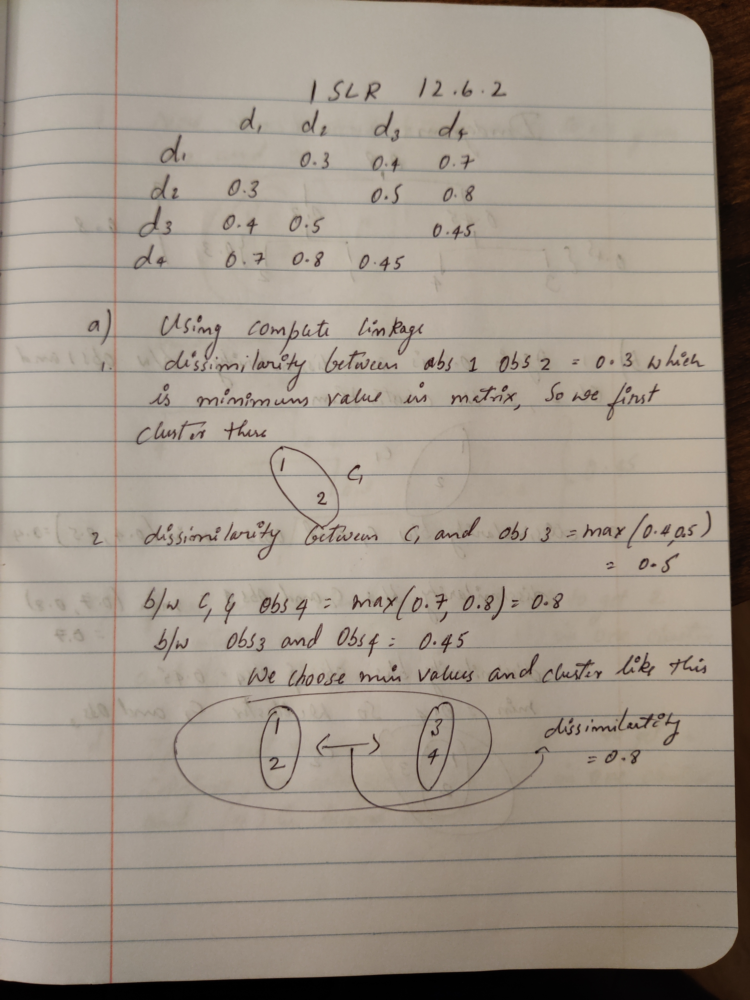

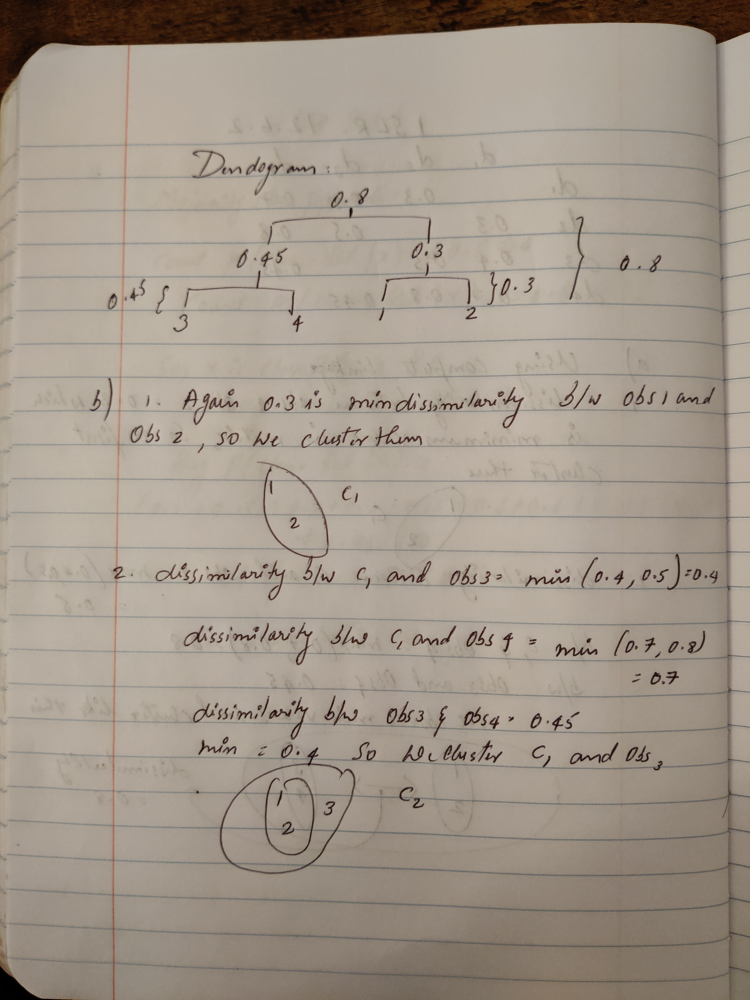

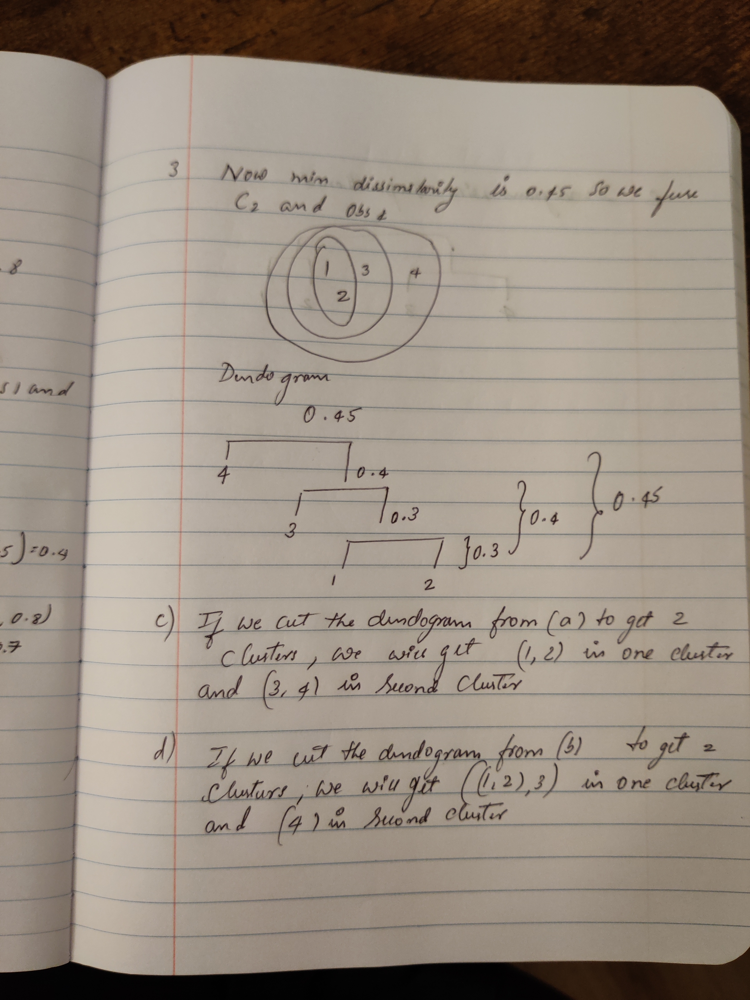

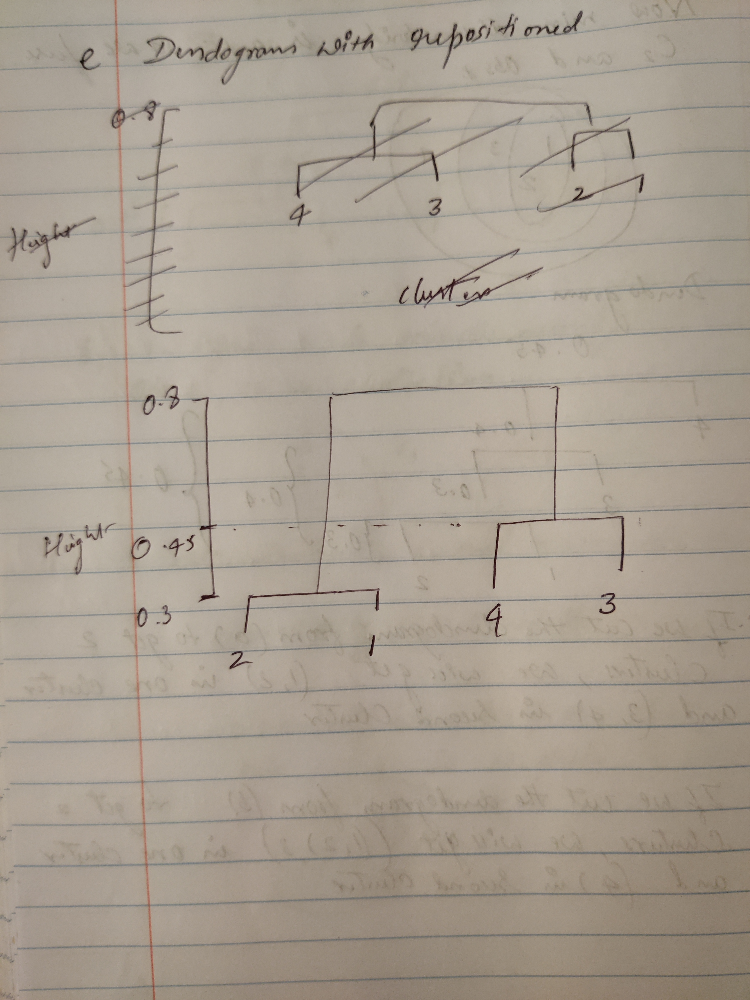